In [1]:
#忽略警告提示
import warnings
warnings.filterwarnings('ignore')

# 讀取資料

import pandas as pd
df = pd.read_csv(r'Bike_Sharing_Demand/train.csv')
pd.set_option('display.max_rows',4 )
df

# 資料說明:
# datetime       #時間和日期
# season        #季節,  1 =春季，2 =夏季，3 =秋季，4 =冬季  
# holiday       #是否是假期, 1=是, 0=否
# workingday    #是否是工作日, 1=是, 0=否
# weather       #天氣,1:晴朗，很少有云，部分多雲，部分多雲; 2:霧+多雲，霧+碎雲，霧+少雲，霧; 3:小雪，小雨+雷雨+散雲，小雨+散雲; 4:大雨+冰塊+雷暴+霧，雪+霧
# temp          #溫度
# atemp         #體感溫度
# humidity      #相對溼度
# windspeed     #風速
# casual        #未註冊使用者租賃數量
# registered    #註冊使用者租賃數量
# count         #所有使用者租賃總數

# 結論:通過以上可以得知資料維度10886行X12列, 除了第一列其它均顯示為數值, 具體的格式還要進一步檢視, 對於各列的解釋也放入下一環節.

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
0,2011-01-01 00:00:00,1,0,0,1,9.84,14.395,81,0.0000,3,13,16
1,2011-01-01 01:00:00,1,0,0,1,9.02,13.635,80,0.0000,8,32,40
...,...,...,...,...,...,...,...,...,...,...,...,...
10884,2012-12-19 22:00:00,4,0,1,1,13.94,17.425,61,6.0032,12,117,129
10885,2012-12-19 23:00:00,4,0,1,1,13.12,16.665,66,8.9981,4,84,88


In [2]:
# 檢視資料整體資訊

df.info()

# 結論:除了datetime為字串型, 其他均為數值型, 且無缺失值.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10886 entries, 0 to 10885
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   datetime    10886 non-null  object 
 1   season      10886 non-null  int64  
 2   holiday     10886 non-null  int64  
 3   workingday  10886 non-null  int64  
 4   weather     10886 non-null  int64  
 5   temp        10886 non-null  float64
 6   atemp       10886 non-null  float64
 7   humidity    10886 non-null  int64  
 8   windspeed   10886 non-null  float64
 9   casual      10886 non-null  int64  
 10  registered  10886 non-null  int64  
 11  count       10886 non-null  int64  
dtypes: float64(3), int64(8), object(1)
memory usage: 1020.7+ KB


In [3]:
# 描述性統計

# 直接指定显示所有的行和列
pd.options.display.max_columns = None
pd.options.display.max_rows = None

df.describe()

# 結論:溫度, 體表溫度, 相對溼度, 風速均近似對稱分佈, 而非註冊使用者, 註冊使用者,以及總數均右邊分佈. 

,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
count,10886.000000,10886.000000,10886.000000,10886.000000,10886.00000,10886.000000,10886.000000,10886.000000,10886.000000,10886.000000,10886.000000
mean,2.506614,0.028569,0.680875,1.418427,20.23086,23.655084,61.886460,12.799395,36.021955,155.552177,191.574132
std,1.116174,0.166599,0.466159,0.633839,7.79159,8.474601,19.245033,8.164537,49.960477,151.039033,181.144454
min,1.000000,0.000000,0.000000,1.000000,0.82000,0.760000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,2.000000,0.000000,0.000000,1.000000,13.94000,16.665000,47.000000,7.001500,4.000000,36.000000,42.000000
50%,3.000000,0.000000,1.000000,1.000000,20.50000,24.240000,62.000000,12.998000,17.000000,118.000000,145.000000
75%,4.000000,0.000000,1.000000,2.000000,26.24000,31.060000,77.000000,16.997900,49.000000,222.000000,284.000000
max,4.000000,1.000000,1.000000,4.000000,41.00000,45.455000,100.000000,56.996900,367.000000,886.000000,977.000000


In [4]:
# 偏態, 峰態

for i in range(5, 12):
    name = df.columns[i]
    print('{0}偏態係數為 {1}, 峰態係數為 {2}'.format(name, df[name].skew(), df[name].kurt()))
    

# 結論:
#   temp, atemp, humidity低度偏態, windspeed中度偏態, casual, registered, count高度偏態

#   temp, atemp, humidity為平峰分佈, windspeed,casual, registered, count為尖峰分佈.

temp偏態係數為 0.003690844422472008, 峰態係數為 -0.9145302637630794
atemp偏態係數為 -0.10255951346908665, 峰態係數為 -0.8500756471754651
humidity偏態係數為 -0.08633518364548581, 峰態係數為 -0.7598175375208864
windspeed偏態係數為 0.5887665265853944, 峰態係數為 0.6301328693364932
casual偏態係數為 2.4957483979812567, 峰態係數為 7.551629305632764
registered偏態係數為 1.5248045868182296, 峰態係數為 2.6260809999210672
count偏態係數為 1.2420662117180776, 峰態係數為 1.3000929518398334


In [5]:
# 由於沒有缺失值, 不用處理缺失值, 看看有沒有重複值.

# 檢查重複值

print('未去重: ', df.shape)
print('去重: ', df.drop_duplicates().shape)

未去重:  (10886, 12)
去重:  (10886, 12)


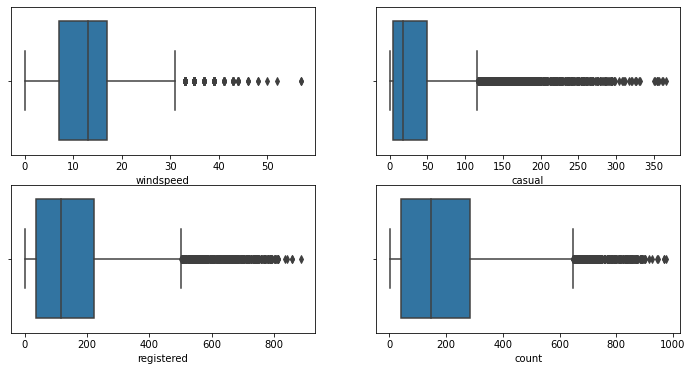

In [6]:
# 沒有重複項, 看看異常值.

# 異常值 >> 通過箱線圖檢視異常值

import seaborn as sns
import matplotlib.pyplot as plt
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 6))
#繪製箱線圖
sns.boxplot(x="windspeed", data=df,ax=axes[0][0])
sns.boxplot(x='casual', data=df, ax=axes[0][1])
sns.boxplot(x='registered', data=df, ax=axes[1][0])
sns.boxplot(x='count', data=df, ax=axes[1][1])
plt.show()

# 結論:租賃數量會受小時的影響, 比如說上班高峰期等, 故在這裡先不處理異常值.

In [7]:
# 資料加工

# 轉換"時間和日期"的格式, 並提取出小時, 日, 月, 年.
df['datetime'] = pd.to_datetime(df['datetime'])
df['hour'] = df.datetime.dt.hour
df['week'] = df.datetime.dt.dayofweek
df['month'] = df.datetime.dt.month
df['year_month'] = df.datetime.dt.strftime('%Y-%m')
df['date'] = df.datetime.dt.date
#刪除datetime
df.drop('datetime', axis = 1, inplace = True)
df

,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count,hour,week,month,year_month,date
0,1,0,0,1,9.84,14.395,81,0.0000,3,13,16,0,5,1,2011-01,2011-01-01
1,1,0,0,1,9.02,13.635,80,0.0000,8,32,40,1,5,1,2011-01,2011-01-01
2,1,0,0,1,9.02,13.635,80,0.0000,5,27,32,2,5,1,2011-01,2011-01-01
3,1,0,0,1,9.84,14.395,75,0.0000,3,10,13,3,5,1,2011-01,2011-01-01
4,1,0,0,1,9.84,14.395,75,0.0000,0,1,1,4,5,1,2011-01,2011-01-01
5,1,0,0,2,9.84,12.880,75,6.0032,0,1,1,5,5,1,2011-01,2011-01-01
6,1,0,0,1,9.02,13.635,80,0.0000,2,0,2,6,5,1,2011-01,2011-01-01
7,1,0,0,1,8.20,12.880,86,0.0000,1,2,3,7,5,1,2011-01,2011-01-01
8,1,0,0,1,9.84,14.395,75,0.0000,1,7,8,8,5,1,2011-01,2011-01-01
9,1,0,0,1,13.12,17.425,76,0.0000,8,6,14,9,5,1,2011-01,2011-01-01


findfont: Font family ['SimHei'] not found. Falling back to DejaVu Sans.


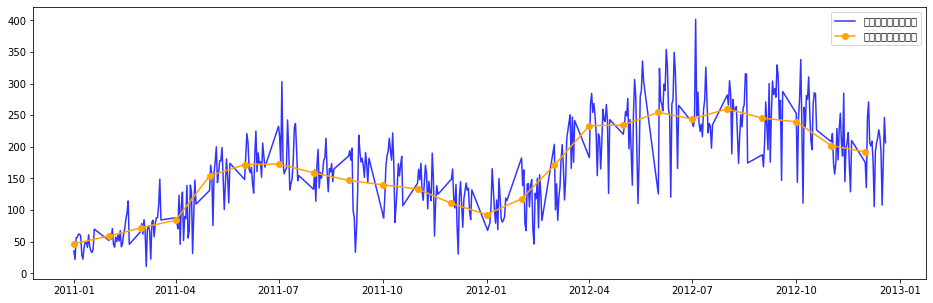

In [8]:
# 特徵分析-日期和總租賃數量

import matplotlib
#設定中文字型
font = {'family': 'SimHei'}
matplotlib.rc('font', **font)
#分別計算日期和月份中位數
group_date = df.groupby('date')['count'].median()
group_month = df.groupby('year_month')['count'].median()
group_month.index = pd.to_datetime(group_month.index)
plt.figure(figsize=(16,5))
plt.plot(group_date.index, group_date.values, '-', color = 'b', label = '每天租賃數量中位數', alpha=0.8)
plt.plot(group_month.index, group_month.values, '-o', color='orange', label = '每月租賃數量中位數')
plt.legend()
plt.show()

# 結論: 2012年相比2011年租賃數量有所增長, 且波動幅度相類似.

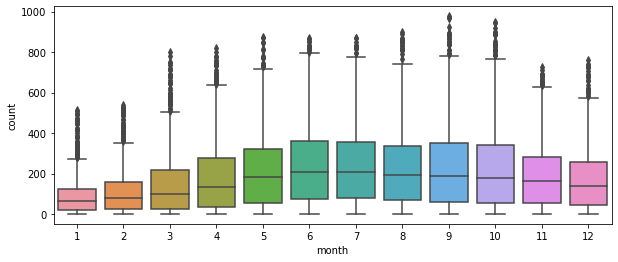

In [9]:
# 特徵分析-月份和總租賃數量

import seaborn as sns
plt.figure(figsize=(10, 4))
sns.boxplot(x='month', y='count', data=df)
plt.show()

# 結論: 與上圖的波動幅度基本一致, 另外每個月均有不同程度的離群值.

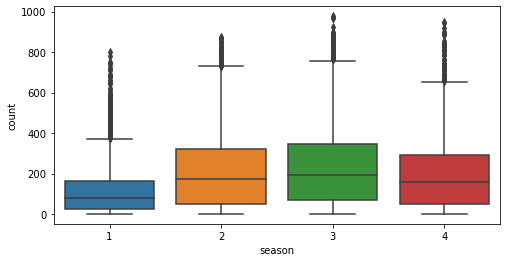

In [10]:
# 特徵分析-季節和總租賃數量

plt.figure(figsize=(8, 4))
sns.boxplot(x='season', y='count', data=df)
plt.show()

# 結論: 就中位數來說, 秋季是最多的, 春季最少且離群值較多.

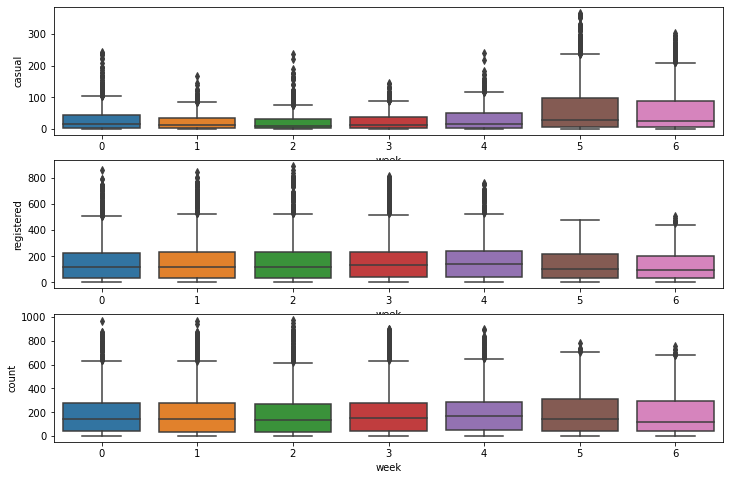

In [11]:
# 特徵分析-星期幾和租賃數量

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(12, 8))
sns.boxplot(x="week",y='casual' ,data=df,ax=axes[0])
sns.boxplot(x='week',y='registered', data=df, ax=axes[1])
sns.boxplot(x='week',y='count', data=df, ax=axes[2])
plt.show()

# 結論: 就中位數來說, 未註冊使用者週六和週日較多, 而註冊使用者則周內較多, 對應的總數也是周內較多, 且周內在總數的離群值較多(0代表週一, 6代表週日)

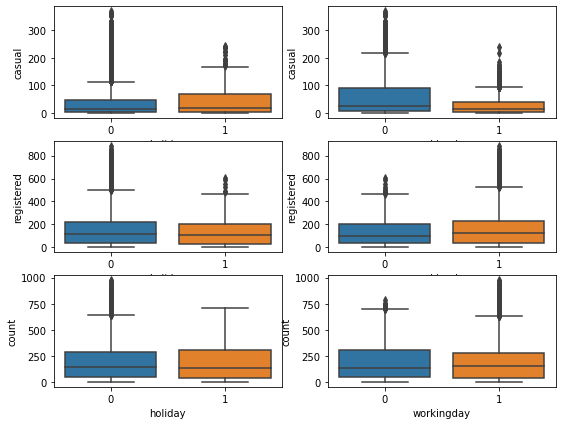

In [12]:
# 特徵分析-節假日, 工作日和總租賃數量

fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(9, 7))
sns.boxplot(x='holiday', y='casual', data=df, ax=axes[0][0])
sns.boxplot(x='holiday', y='registered', data=df, ax=axes[1][0])
sns.boxplot(x='holiday', y='count', data=df, ax=axes[2][0])
sns.boxplot(x='workingday', y='casual', data=df, ax=axes[0][1])
sns.boxplot(x='workingday', y='registered', data=df, ax=axes[1][1])
sns.boxplot(x='workingday', y='count', data=df, ax=axes[2][1])
plt.show()

# 結論:
# 未註冊使用者: 在節假日較多, 在工作日較少

# 註冊使用者: 在節假日較少, 在工作日較多

# 總的來說, 節假日租賃較少, 工作日租賃較多, 初步猜測多數未註冊使用者租賃自行車是用來非工作日出遊, 而多數註冊使用者則是工作日用來上班或者上學.

findfont: Font family ['SimHei'] not found. Falling back to DejaVu Sans.


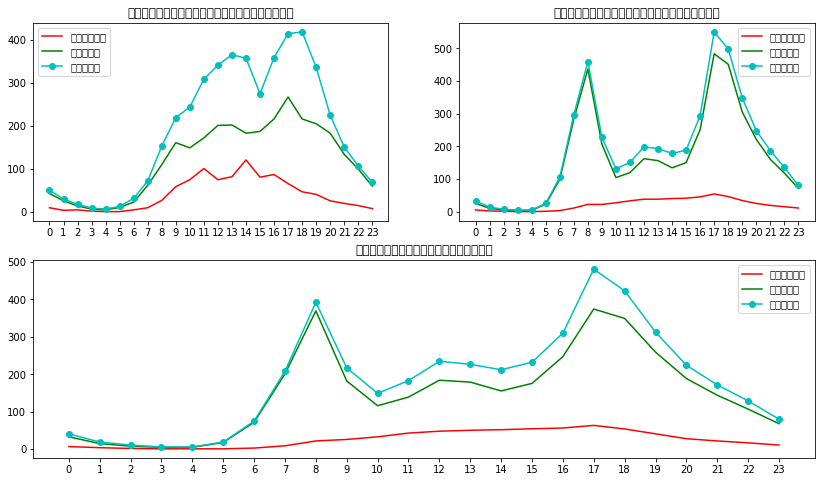

In [13]:
# 特徵分析-小時和總租賃數量的關係


#繪製第一個子圖
plt.figure(1, figsize=(14, 8))
plt.subplot(221)
hour_casual = df[df.holiday==1].groupby('hour')['casual'].median()
hour_registered = df[df.holiday==1].groupby('hour')['registered'].median()
hour_count = df[df.holiday==1].groupby('hour')['count'].median()
plt.plot(hour_casual.index, hour_casual.values, '-', color='r', label='未註冊使用者')
plt.plot(hour_registered.index, hour_registered.values, '-', color='g', label='註冊使用者')
plt.plot(hour_count.index, hour_count.values, '-o', color='c', label='所有使用者')
plt.legend()
plt.xticks(hour_casual.index)
plt.title('未註冊使用者和註冊使用者在節假日自行車租賃情況')
#繪製第二個子圖
plt.subplot(222)
hour_casual = df[df.workingday==1].groupby('hour')['casual'].median()
hour_registered = df[df.workingday==1].groupby('hour')['registered'].median()
hour_count = df[df.workingday==1].groupby('hour')['count'].median()
plt.plot(hour_casual.index, hour_casual.values, '-', color='r', label='未註冊使用者')
plt.plot(hour_registered.index, hour_registered.values, '-', color='g', label='註冊使用者')
plt.plot(hour_count.index, hour_count.values, '-o', color='c', label='所有使用者')
plt.legend()
plt.title('未註冊使用者和註冊使用者在工作日自行車租賃情況')
plt.xticks(hour_casual.index)
#繪製第三個子圖
plt.subplot(212)
hour_casual = df.groupby('hour')['casual'].median()
hour_registered = df.groupby('hour')['registered'].median()
hour_count = df.groupby('hour')['count'].median()
plt.plot(hour_casual.index, hour_casual.values, '-', color='r', label='未註冊使用者')
plt.plot(hour_registered.index, hour_registered.values, '-', color='g', label='註冊使用者')
plt.plot(hour_count.index, hour_count.values, '-o', color='c', label='所有使用者')
plt.legend()
plt.title('未註冊使用者和註冊使用者自行車租賃情況')
plt.xticks(hour_casual.index)
plt.show()

# 結論:
# 在節假日, 未註冊使用者和註冊使用者走勢相接近, 不過未註冊使用者最高峰在14點, 而註冊使用者則是17點

# 在工作日,  註冊使用者呈現出雙峰走勢, 在8點和17點均為用車高峰期, 而這正是上下班或者上下學高峰期. 

# 對於註冊使用者來說, 17點在節假日和工作日均為高峰期, 說明部分使用者在節假日可能未必休假. 

<AxesSubplot:xlabel='weather', ylabel='count'>

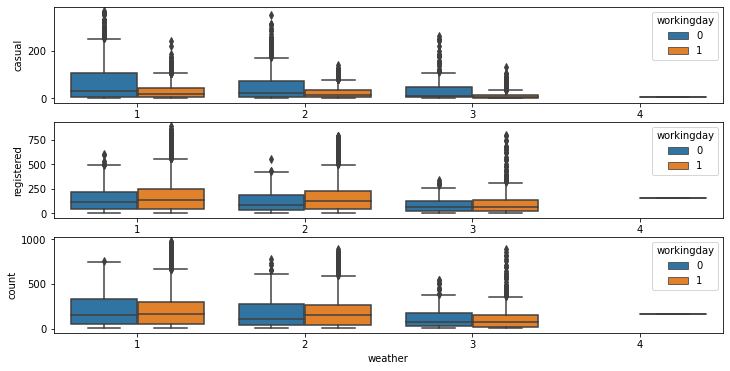

In [14]:
# 特徵分析-天氣和總租賃數量

fig, ax = plt.subplots(3, 1, figsize=(12, 6))
sns.boxplot(x='weather', y='casual', hue='workingday',data=df, ax=ax[0])
sns.boxplot(x='weather', y='registered',hue='workingday', data=df, ax=ax[1])
sns.boxplot(x='weather', y='count',hue='workingday', data=df, ax=ax[2])

# 結論: 就中位數而言未註冊使用者和註冊使用者均表現為: 在工作日和非工作日租賃數量均隨著天氣的惡劣而減少, 特別地, 當天氣為大雨大雪天(4)且非工作日均沒有自行車租賃.

In [15]:
# 從圖上可以看出, 大雨大雪天只有一個數據, 我們看看原資料.

df[df.weather==4]

# 結論: 只有在2012年1月9日18時為大雨大雪天, 說明天氣是突然變化的, 部分使用者可能因為沒有看天氣預報而租賃自行車, 當然也有其他原因.

,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count,hour,week,month,year_month,date
5631,1,0,1,4,8.2,11.365,86,6.0032,6,158,164,18,0,1,2012-01,2012-01-09


<AxesSubplot:xlabel='season', ylabel='month'>

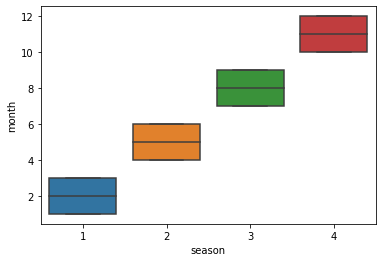

In [16]:
sns.boxplot(x='season', y='month',data=df)

# 123為春季, 456為夏季, 789為秋季... 
# 結論: 季節的劃分通常和緯度相關, 而這份資料是用來預測美國華盛頓的租賃數量, 且美國和我國的緯度基本一樣, 故按照345春節, 678夏季..這個規則來重新劃分.

<AxesSubplot:xlabel='group_season', ylabel='temp'>

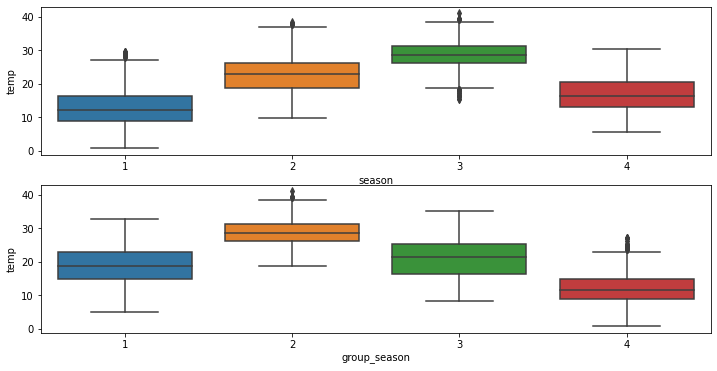

In [17]:
import numpy as np
df['group_season'] = np.where((df.month <=5) & (df.month >=3), 1,
                        np.where((df.month <=8) & (df.month >=6), 2,
                                 np.where((df.month <=11) & (df.month >=9), 3, 4)))
fig, ax = plt.subplots(2, 1, figsize=(12, 6))
#繪製氣溫和季節箱線圖
sns.boxplot(x='season', y='temp',data=df, ax=ax[0])
sns.boxplot(x='group_season', y='temp',data=df, ax=ax[1])

# 結論:
# 第一個圖是調整之前的, 就中位數來說, 春季氣溫最低, 秋季氣溫最高

# 第二個圖是調整之後的, 就中位數來說, 冬季氣溫最低, 夏季氣溫最高

# 顯然第二張的圖的結果較符合常理, 故刪除另外那一列.

In [18]:
# 刪除另外那一列

df.drop('season', axis=1, inplace=True)
df.shape

(10886, 16)

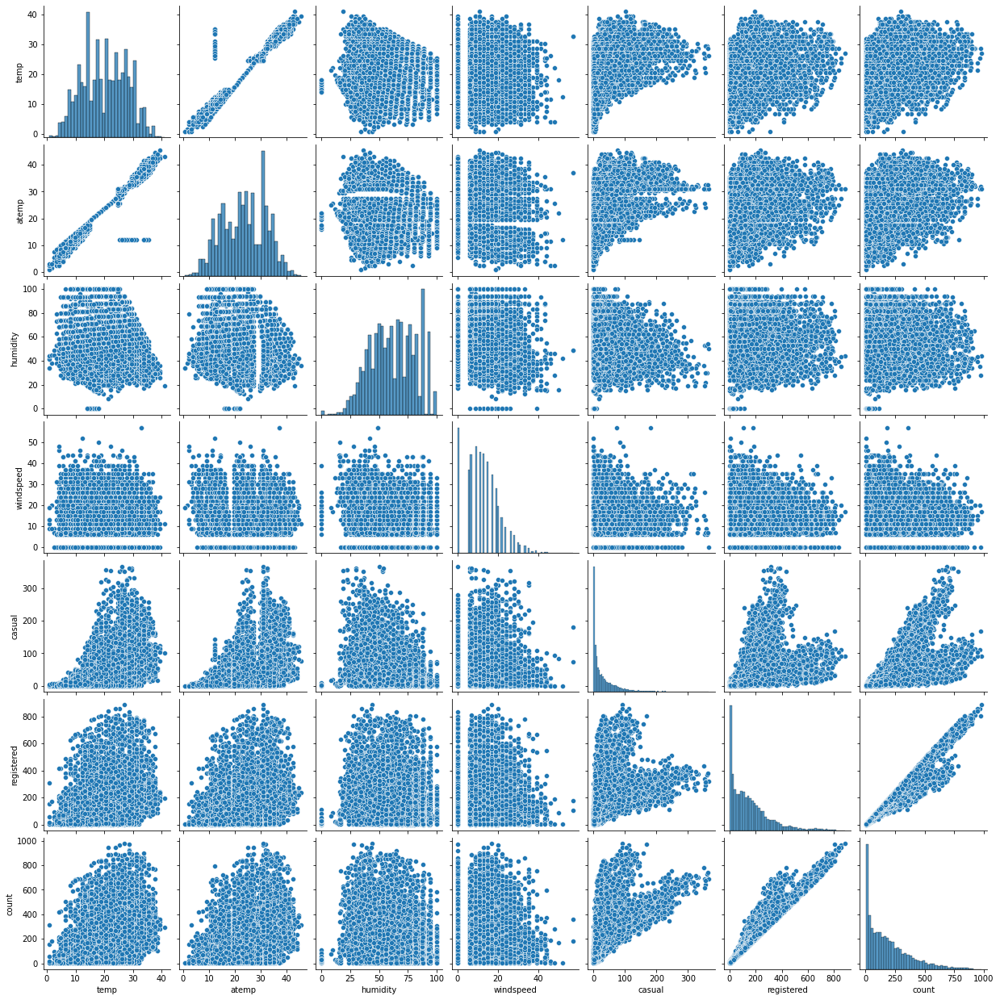

In [19]:
# 特徵分析-其他變數和總租賃數量的關係

# 這裡我直接使用利用seaborn的pairplot繪製剩餘的溫度, 體感溫度, 相對溼度, 風速這四個連續變數與未註冊使用者和註冊使用者的關係在一張圖上.

sns.pairplot(df[['temp', 'atemp', 'humidity', 'windspeed', 'casual', 'registered', 'count']])


# 為了方便縱覽全域性, 我將圖片尺寸縮小, 如下圖所示. 縱軸從上往下依次是溫度, 體感溫度, 相對溼度, 風速, 未註冊使用者, 註冊使用者, 所有使用者, 橫軸從左往右是同樣的順序.

# 結論: 
# 從圖上可以看出, 溫度和體感溫度分別與未註冊使用者, 註冊使用者, 所有使用者均有一定程度的正相關, 而相對溼度和風速與之呈現一定程度的負相關.
# 另外, 其他變數之間也有不同程度的相關關係.
# 另外, 第四列(風速)在散點圖中間有明顯的間隙. 需要揪出這一塊來看看.

In [20]:
df['windspeed']

# 結論: 風速為0, 這明顯不合理, 把其當成缺失值來處理. 我這裡選擇的是向後填充.

0         0.0000
1         0.0000
2         0.0000
3         0.0000
4         0.0000
5         6.0032
6         0.0000
7         0.0000
8         0.0000
9         0.0000
10       16.9979
11       19.0012
12       19.0012
13       19.9995
14       19.0012
15       19.9995
16       19.9995
17       19.0012
18       16.9979
19       16.9979
20       16.9979
21       12.9980
22       15.0013
23       19.9995
24       19.9995
25       16.9979
26       19.0012
27       12.9980
28       12.9980
29       19.9995
30       12.9980
31       15.0013
32       15.0013
33       15.0013
34       16.9979
35       19.9995
36        8.9981
37       12.9980
38       11.0014
39       11.0014
40       12.9980
41       22.0028
42       30.0026
43       23.9994
44       22.0028
45       19.9995
46       11.0014
47       23.9994
48       27.9993
49       26.0027
50       19.0012
51       26.0027
52       12.9980
53       19.0012
54       26.0027
55       16.9979
56       22.0028
57       19.9995
58       19.00

In [21]:
# 向後填充
df.loc[df.windspeed == 0, 'windspeed'] = np.nan
df.fillna(method='bfill', inplace=True)
df.windspeed.isnull().sum()

0

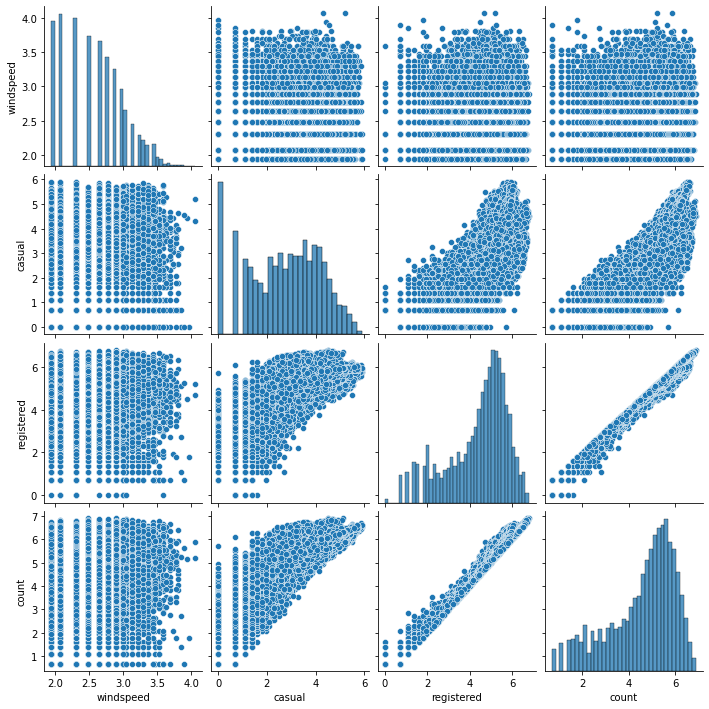

In [22]:
# 特徵分析-相關矩陣

#對數轉換
df['windspeed'] = np.log(df['windspeed'].apply(lambda x: x+1))
df['casual'] = np.log(df['casual'].apply(lambda x: x+1))
df['registered'] = np.log(df['registered'].apply(lambda x: x+1))
df['count'] = np.log(df['count'].apply(lambda x: x+1))
sns.pairplot(df[['windspeed', 'casual', 'registered', 'count']])

# 結論: 經過對數變換之後, 註冊使用者和所有使用者的租賃數量和正態還是相差較大, 故在計算相關係數時選擇spearman相關係數.

<AxesSubplot:>

findfont: Font family ['SimHei'] not found. Falling back to DejaVu Sans.


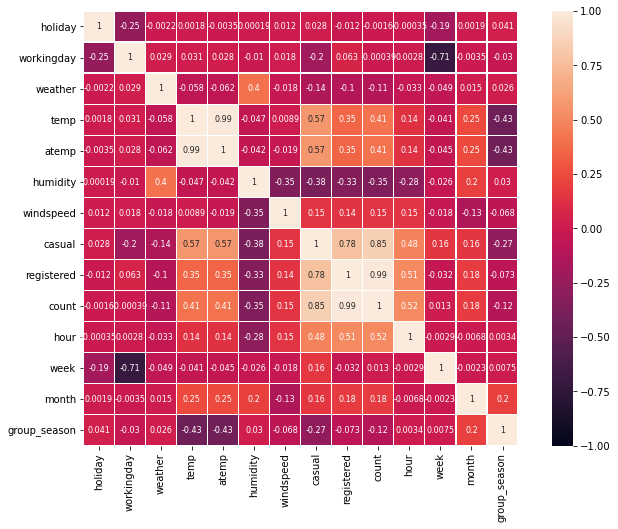

In [23]:
# spearman相關矩陣

correlation = df.corr(method='spearman')
plt.figure(figsize=(12, 8))
#繪製熱力圖
sns.heatmap(correlation, linewidths=0.2, vmax=1, vmin=-1, linecolor='w',
            annot=True,annot_kws={'size':8},square=True)

# 結論: 均有不同程度的相關程度, 其中, temp和atemp高度相關, count和registered高度相關, 數值均達到0.99. 

In [24]:
# 嶺迴歸和Lasso迴歸是加了正則化項的線性迴歸, 下面將分別構造兩個模型.

# 嶺迴歸-劃分資料集
from sklearn.model_selection import train_test_split
# 由於所有使用者的租賃數量是由未註冊使用者和註冊使用者相加而成, 故刪除.
df.drop(['casual','registered'], axis=1, inplace=True)

# 字串轉數字
df["year_month"] = pd.to_datetime(df["year_month"]).dt.strftime("%Y%m%d")
df["date"] = pd.to_datetime(df["date"]).dt.strftime("%Y%m%d")

X = df.drop(['count'], axis=1)
y = df['count']
# 劃分訓練集和測試集
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

In [25]:
# 嶺迴歸-模型訓練

from sklearn.linear_model import Ridge
# 這裡的alpha指的是正則化項引數, 初始先設定為1.
rd = Ridge(alpha=1)
rd.fit(X_train, y_train)
print(rd.coef_)
print(rd.intercept_)

# 結論: 通過前面我們知道, 正則化項引數對結果的影響較大, 下一步我們就通過嶺跡圖來選擇正則化引數.

[ 0.00369607  0.00876689 -0.01068934  0.00481459  0.03729175 -0.01423578
  0.11712984  0.09852197  0.03046542  0.05841654 -0.00324919  0.00329072
 -0.00882766]
-832.8219537308437


Font 'default' does not have a glyph for '\u6b63' [U+6b63], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\u5247' [U+5247], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\u5316' [U+5316], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\u9805' [U+9805], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\u5f15' [U+5f15], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\u6578' [U+6578], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\u548c' [U+548c], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\u8ff4' [U+8ff4], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\u6b78' [U+6b78], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\u4fc2' [U+4fc2], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\u5dba' [U+5dba], 

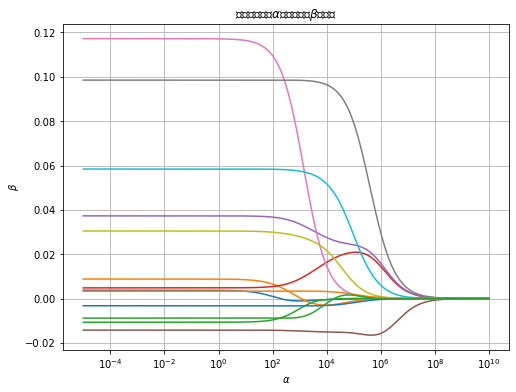

In [26]:
# 設定引數以及訓練模型
alphas = 10**np.linspace(-5, 10, 500)
betas = []
for alpha in alphas:
    rd = Ridge(alpha = alpha)
    rd.fit(X_train, y_train)
    betas.append(rd.coef_)
# 繪製嶺跡圖
plt.figure(figsize=(8,6))
plt.plot(alphas, betas)
# 對資料進行對數轉換, 便於觀察.
plt.xscale('log')
# 新增網格線
plt.grid(True)
# 座標軸適應資料量
plt.axis('tight')
plt.title(r'正則化項引數$\alpha$和迴歸係數$\beta$嶺跡圖')
plt.xlabel(r'$\alpha$')
plt.ylabel(r'$\beta$')
plt.show()

# 結論: 通過影象可以看出, 當alpha為107時所有變數嶺跡趨於穩定.按照嶺跡法應當取alpha=107.

# 但是由於是通過肉眼觀察的, 其不一定是最佳, 採用另外一種方式: 交叉驗證的嶺迴歸.

In [33]:
# 交叉驗證的嶺迴歸
from sklearn.linear_model import RidgeCV
from sklearn import metrics
rd_cv = RidgeCV(alphas=alphas, cv=10, scoring='r2')
rd_cv.fit(X_train, y_train)
print(rd_cv.alpha_)

# 結論: 最後選出的最佳正則化項引數為375.96, 然後用這個引數進行模型訓練

375.96749657854673


In [38]:
# 嶺迴歸-模型訓練
rd = Ridge(alpha=375.96749657854673) #, fit_intercept=False
rd.fit(X_train, y_train)
print(rd.coef_)
print(rd.intercept_)

[-0.00077032  0.00337136 -0.00741143  0.00677867  0.03548922 -0.01445114
  0.09272622  0.09850917  0.02904163  0.05805275 -0.00328411  0.00332552
 -0.00883877]
-830.3604430502284


In [40]:
# 嶺迴歸-模型預測

from sklearn import metrics
from math import sqrt
# 分別預測訓練資料和測試資料
y_train_pred = rd.predict(X_train)
y_test_pred = rd.predict(X_test)
# 分別計算其均方根誤差和擬合優度
y_train_rmse = sqrt(metrics.mean_squared_error(y_train, y_train_pred))
y_train_score = rd.score(X_train, y_train)
y_test_rmse = sqrt(metrics.mean_squared_error(y_test, y_test_pred))
y_test_score = rd.score(X_test, y_test)
print('訓練集RMSE: {0}, 評分: {1}'.format(y_train_rmse, y_train_score))
print('測試集RMSE: {0}, 評分: {1}'.format(y_test_rmse, y_test_score))

訓練集RMSE: 1.013914069105002, 評分: 0.4882223064320941
測試集RMSE: 1.0221367465248372, 評分: 0.4871850414484432


Font 'default' does not have a glyph for '\u6b63' [U+6b63], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\u5247' [U+5247], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\u5316' [U+5316], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\u9805' [U+9805], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\u5f15' [U+5f15], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\u6578' [U+6578], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\u548c' [U+548c], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\u8ff4' [U+8ff4], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\u6b78' [U+6b78], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\u4fc2' [U+4fc2], substituting with a dummy symbol.
Font 'default' does not have a glyph for '\u7684' [U+7684], 

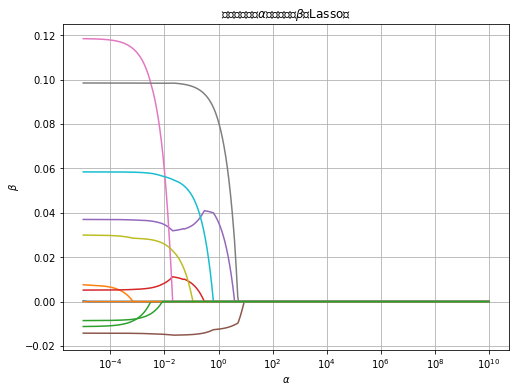

In [41]:
# Lasso迴歸-模型訓練

from sklearn.linear_model import Lasso
alphas = 10**np.linspace(-5, 10, 500)
betas = []
for alpha in alphas:
    Las = Lasso(alpha = alpha)
    Las.fit(X_train, y_train)
    betas.append(Las.coef_)
plt.figure(figsize=(8,6))
plt.plot(alphas, betas)
plt.xscale('log')
plt.grid(True)
plt.axis('tight')
plt.title(r'正則化項引數$\alpha$和迴歸係數$\beta$的Lasso圖')
plt.xlabel(r'$\alpha$')
plt.ylabel(r'$\beta$')
plt.show()

# 結論: 通過Lasso迴歸曲線, 可以看出大致在10附近所有變數趨於穩定

In [42]:
# 同樣採用交叉驗證選擇Lasso迴歸最優正則化項引數

from sklearn.linear_model import LassoCV
from sklearn import metrics
Las_cv = LassoCV(alphas=alphas, cv=10)
Las_cv.fit(X_train, y_train)
Las_cv.alpha_

0.005074705239490466

In [44]:
# 用這個引數重新訓練模型

Las = Lasso(alpha=0.005074705239490466) #, fit_intercept=False
Las.fit(X_train, y_train)
print(Las.coef_)
print(Las.intercept_)

[-0.00000000e+00 -0.00000000e+00 -0.00000000e+00  6.76963467e-03
  3.58769325e-02 -1.45941531e-02  8.73811977e-02  9.83756823e-02
  2.73539182e-02  5.73260268e-02  3.73455625e-05  3.99885635e-06
 -3.47406593e-03]
-828.9755667473622


In [46]:
# Lasso迴歸-模型預測

#用Lasso分別預測訓練集和測試集, 並計算均方根誤差和擬合優度
y_train_pred = Las.predict(X_train)
y_test_pred = Las.predict(X_test)
y_train_rmse = sqrt(metrics.mean_squared_error(y_train, y_train_pred))
y_train_score = Las.score(X_train, y_train)
y_test_rmse = sqrt(metrics.mean_squared_error(y_test, y_test_pred))
y_test_score = Las.score(X_test, y_test)
print('訓練集RMSE: {0}, 評分: {1}'.format(y_train_rmse, y_train_score))
print('測試集RMSE: {0}, 評分: {1}'.format(y_test_rmse, y_test_score))

訓練集RMSE: 1.0141362479637233, 評分: 0.4879979902981103
測試集RMSE: 1.0221197755671672, 評分: 0.48720207026329465


In [47]:
# 最後, 再用傳統的線性迴歸進行預測, 從而對比三者之間的差異.

from sklearn.linear_model import LinearRegression
#訓練線性迴歸模型
LR = LinearRegression()
LR.fit(X_train, y_train)
print(LR.coef_)
print(LR.intercept_)
#分別預測訓練集和測試集, 並計算均方根誤差和擬合優度
y_train_pred = LR.predict(X_train)
y_test_pred = LR.predict(X_test)
y_train_rmse = sqrt(metrics.mean_squared_error(y_train, y_train_pred))
y_train_score = LR.score(X_train, y_train)
y_test_rmse = sqrt(metrics.mean_squared_error(y_test, y_test_pred))
y_test_score = LR.score(X_test, y_test)
print('訓練集RMSE: {0}, 評分: {1}'.format(y_train_rmse, y_train_score))
print('測試集RMSE: {0}, 評分: {1}'.format(y_test_rmse, y_test_score))


# 總結: 就測試集和訓練集均方根誤差之差來說, 線性迴歸最大, 嶺迴歸最小, 另外迴歸在測試集的擬合優度最大, 總體來說, 嶺迴歸在此資料集上表現略優. 

[ 0.0037454   0.00879804 -0.01070083  0.00480792  0.03729793 -0.01423503
  0.11721219  0.09852195  0.03047269  0.05841754 -0.00324908  0.00329061
 -0.00882716]
-832.8302967758384
訓練集RMSE: 1.0138625204875227, 評分: 0.4882743439029843
測試集RMSE: 1.0223352979788825, 評分: 0.4869857920909092
